# Semiconductor Manufacturing Process

#### Context:

A complex modern semiconductor manufacturing process is normally 
under constant surveillance via the monitoring of signals variables collected from 
sensors and or process measurement points. However, not all of these signals are 
equally valuable in a specific monitoring system. The measured signals contain a 
combination of useful information, irrelevant information as well as noise. Engineers 
typically have a much larger number of signals than are required. If we consider each 
type of signal as a feature, then feature selection may be applied to identify the most 
relevant signals. The Process Engineers may then use these signals to determine key 
factors contributing to yield excursions downstream in the process. This will enable an 
increase in process throughput, decreased time to learning and reduce the per unit 
production costs. These signals can be used as features to predict the yield type. And by 
analysing and trying out different combinations of features, essential signals that are 
impacting the yield type can be identified.

#### DATA DESCRIPTION: sensor-data.csv : (1567, 592)

The data consists of 1567 examples each with 591 features.
The dataset presented in this case represents a selection of such features where each 
example represents a single production entity with associated measured features and 
the labels represent a simple pass/fail yield for in house line testing. Target column “ –1” 
corresponds to a pass and “1” corresponds to a fail and the data time stamp is for that 
specific test point.

#### PROJECT OBJECTIVE:

We will build a classifier to predict the Pass/Fail yield of a 
particular process entity and analyse whether all the features are required to build the 
model or not.


### 1. Importing and Exporting the data.

Importing the data as csv file using pandas and printing the top 5 rows and the characteristics of the given dataset.

Before that, we import the necessary libraries.

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
data = pd.read_csv(r'C:\Users\fahee\Project 2\sensor-data.csv')
print(data.head())
print(data.info())
print(data.describe())

                  Time        0        1          2          3       4      5  \
0  2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602  100.0   
1  2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294  100.0   
2  2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102  100.0   
3  2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204  100.0   
4  2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334  100.0   

          6       7       8  ...       581     582     583     584      585  \
0   97.6133  0.1242  1.5005  ...       NaN  0.5005  0.0118  0.0035   2.3630   
1  102.3433  0.1247  1.4966  ...  208.2045  0.5019  0.0223  0.0055   4.4447   
2   95.4878  0.1241  1.4436  ...   82.8602  0.4958  0.0157  0.0039   3.1745   
3  104.2367  0.1217  1.4882  ...   73.8432  0.4990  0.0103  0.0025   2.0544   
4  100.3967  0.1235  1.5031  ...       NaN  0.4800  0.4766  0.1045  99.3032   

      586     587     588       589  P

### 2. Data cleansing: • Missing value treatment. • Drop attribute/s if required using relevant functional knowledge. • Make all relevant modifications on the data using both functional/logical reasoning/assumptions.

#### Missing value treatment.

1) First of all, we are checking for any missing values present in the data.

2) After checking the missing values from the given dataset, we try separating the numeric and non-numeric columns of the dataset.

3) Separating the numeric and non-numeric columns of the dataset, we handle the missing values we found in the first step.

4) Using 'forward fill' method to handle the missing values in the non-numeric column.

5) Finally, we verify if all the missing values are verified in the data cleansing process.

In [3]:
# 1
missing_values = data.isnull().sum()
print("Missing values in each column:\n", missing_values[missing_values > 0])

# 2
numeric_columns = data.select_dtypes(include=[np.number]).columns
non_numeric_columns = data.select_dtypes(exclude=[np.number]).columns

# 3
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())

# 4
data[non_numeric_columns] = data[non_numeric_columns].fillna(method='ffill')

# 5
missing_values_after_imputation = data.isnull().sum()
print("Missing values after imputation:\n", missing_values_after_imputation[missing_values_after_imputation > 0])

Missing values in each column:
 0       6
1       7
2      14
3      14
4      14
       ..
585     1
586     1
587     1
588     1
589     1
Length: 538, dtype: int64
Missing values after imputation:
 Series([], dtype: int64)


C:\Users\fahee\AppData\Local\Temp\ipykernel_18172\401659672.py:13: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[non_numeric_columns] = data[non_numeric_columns].fillna(method='ffill')


#### The below code shows the statistical summary after the missing value treatment.

In [4]:
statistical_summary = data.describe()
print("Statistical Summary:\n", statistical_summary)

Statistical Summary:
                  0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.452896  2495.850231  2200.547318  1396.376627     4.197013   
std      73.480613    80.227793    29.380932   439.712852    56.103066   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  2181.099950  1083.885800     1.017700   
50%    3011.840000  2498.910000  2200.955600  1287.353800     1.317100   
75%    3056.540000  2538.745000  2218.055500  1590.169900     1.529600   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  ...  \
count  1567.0  1567.000000  1567.000000  1567.000000  1567.000000  ...   
mean    100.0   101.112908     0.121822     1.462862    -0.000841  ...   
std       0.0     6.209271     0.008936     0.073849     0.015107  ...   
min     100.0  

#### Handling the missing values: Based on the extent and pattern of missing values, we are choosing an appropriate strategy. Using common methods such as filling missing values with mean, median, mode, or a specific value, or dropping rows/columns with missing values

1) After the missing value treatment, we try to fill in the missing values with the measure of central tendencies such as median and mode.

2) Later we drop the columns with more than 20% missing values and rows with remaining missing values.

In [5]:
df = pd.read_csv(r"C:\Users\fahee\Project 2\sensor-data.csv")
missing_values = df.isnull().sum()
print("Missing values per column before cleaning:")
print(missing_values[missing_values > 0])
numeric_cols = df.select_dtypes(include=['number']).columns
non_numeric_cols = df.select_dtypes(exclude=['number']).columns

# 1
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

# 1
for col in non_numeric_cols:
    df[col] = df[col].fillna(df[col].mode()[0])

# 2
df.dropna(axis=1, thresh=int(0.8 * len(df)), inplace=True)

# 2
df.dropna(inplace=True)
print("Missing values per column after cleaning:")
print(df.isnull().sum())
print(df.info())
print(df.describe())
print(df.head())

Missing values per column before cleaning:
0       6
1       7
2      14
3      14
4      14
       ..
585     1
586     1
587     1
588     1
589     1
Length: 538, dtype: int64
Missing values per column after cleaning:
Time         0
0            0
1            0
2            0
3            0
            ..
586          0
587          0
588          0
589          0
Pass/Fail    0
Length: 592, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1567 entries, 0 to 1566
Columns: 592 entries, Time to Pass/Fail
dtypes: float64(590), int64(1), object(1)
memory usage: 7.1+ MB
None
                 0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.441551  2495.866110  2200.551958  1395.383474     4.171281   
std      73.480841    80.228143    29.380973   439.837330    56.103721   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  21

### 3. Data analysis & visualisation

We perform detailed data analysis on the dataset given and then proceeding with univariate, bivariate and multivariate analysis.
1. Detailed Statistical Analysis
First, we will perform basic statistical analysis to understand the distribution of the data.

In [6]:
# Descriptive statistics for numeric columns
descriptive_stats = df[numeric_cols].describe()
print("\nDescriptive Statistics:")
pd.set_option('display.max_columns', None)
print(descriptive_stats)

# Correlation matrix for numeric columns
correlation_matrix = df[numeric_cols].corr()
print("\nCorrelation Matrix:")
print(correlation_matrix)


Descriptive Statistics:
                 0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.441551  2495.866110  2200.551958  1395.383474     4.171281   
std      73.480841    80.228143    29.380973   439.837330    56.103721   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  2181.099950  1083.885800     1.017700   
50%    3011.490000  2499.405000  2201.066700  1285.214400     1.316800   
75%    3056.540000  2538.745000  2218.055500  1590.169900     1.518800   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  \
count  1567.0  1567.000000  1567.000000  1567.000000  1567.000000   
mean    100.0   101.116476     0.121825     1.462860    -0.000842   
std       0.0     6.209385     0.008936     0.073849     0.015107   
min     100.0    82.131100     0

Descriptive Statistics: Provides a summary of the central tendency, dispersion, and shape of the dataset’s distribution.


Correlation Matrix: Helps to identify the relationship between different features and the target variable.

#### Univariate Analysis:

Univariate analysis involves examining each variable individually.

1) First, we get histograms for the numeric features of the dataset.
2) Next, we get boxplots for the numeric features of the dataset.


Univariate Analysis - Histograms:


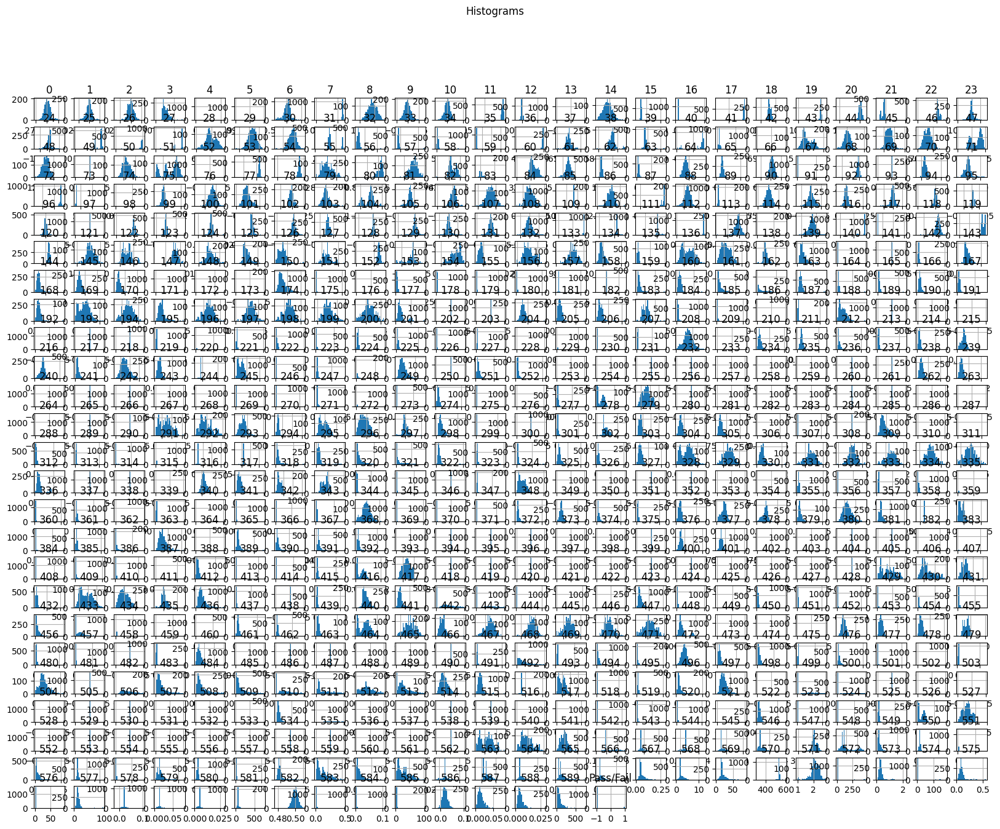

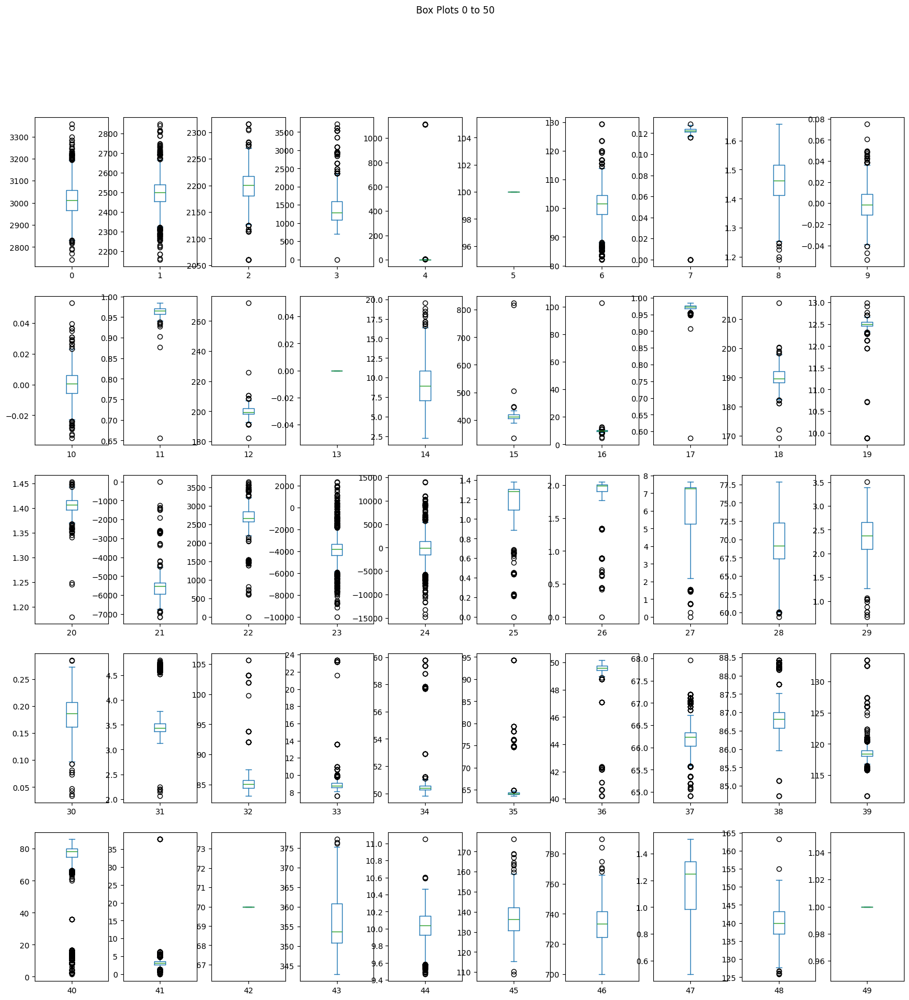

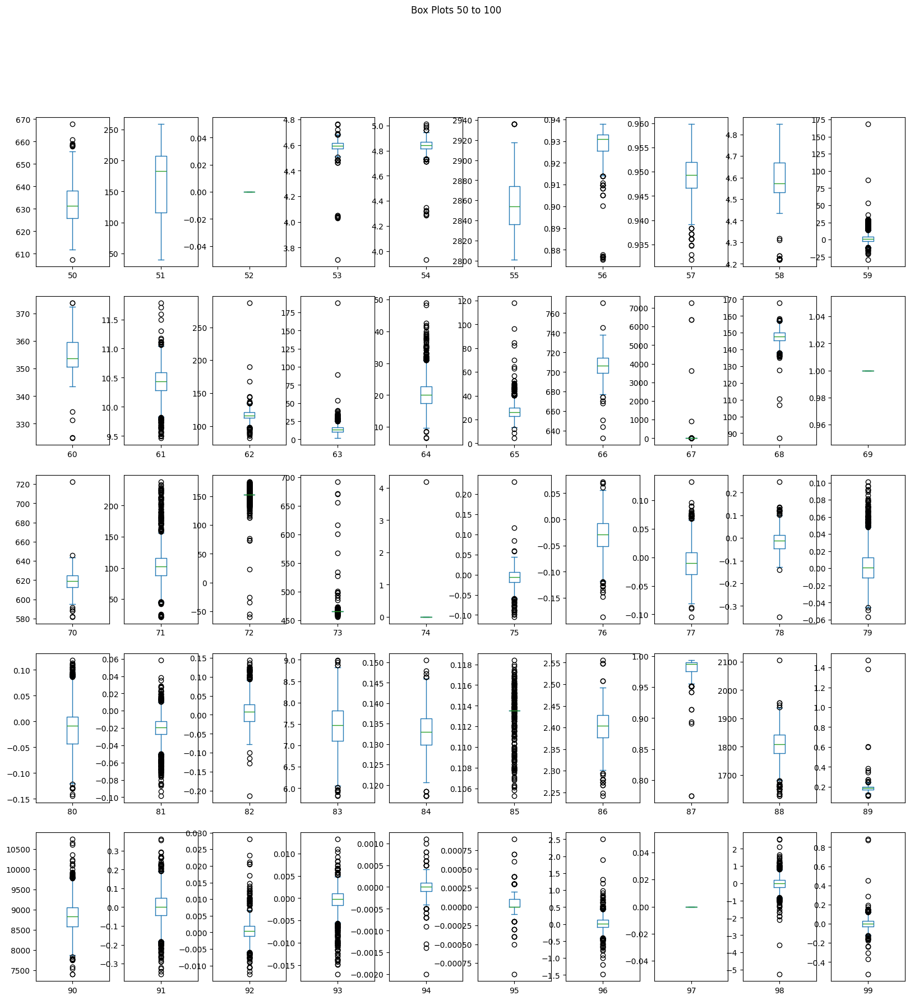

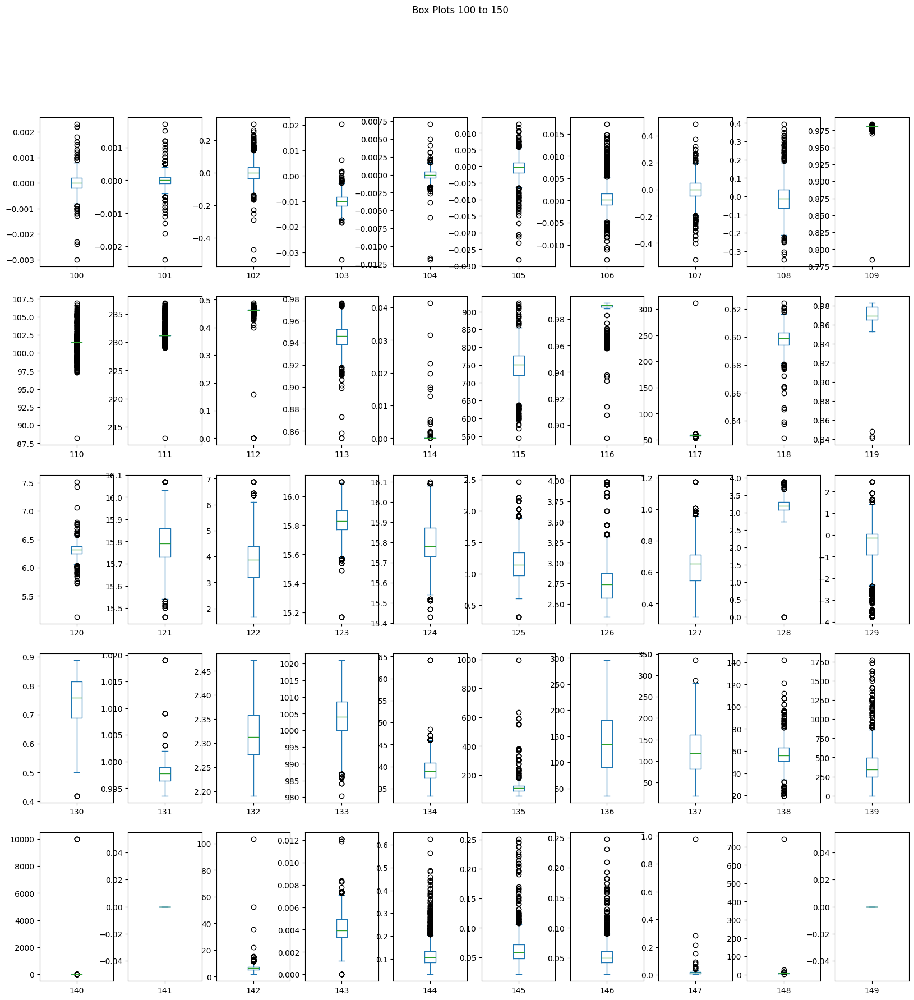

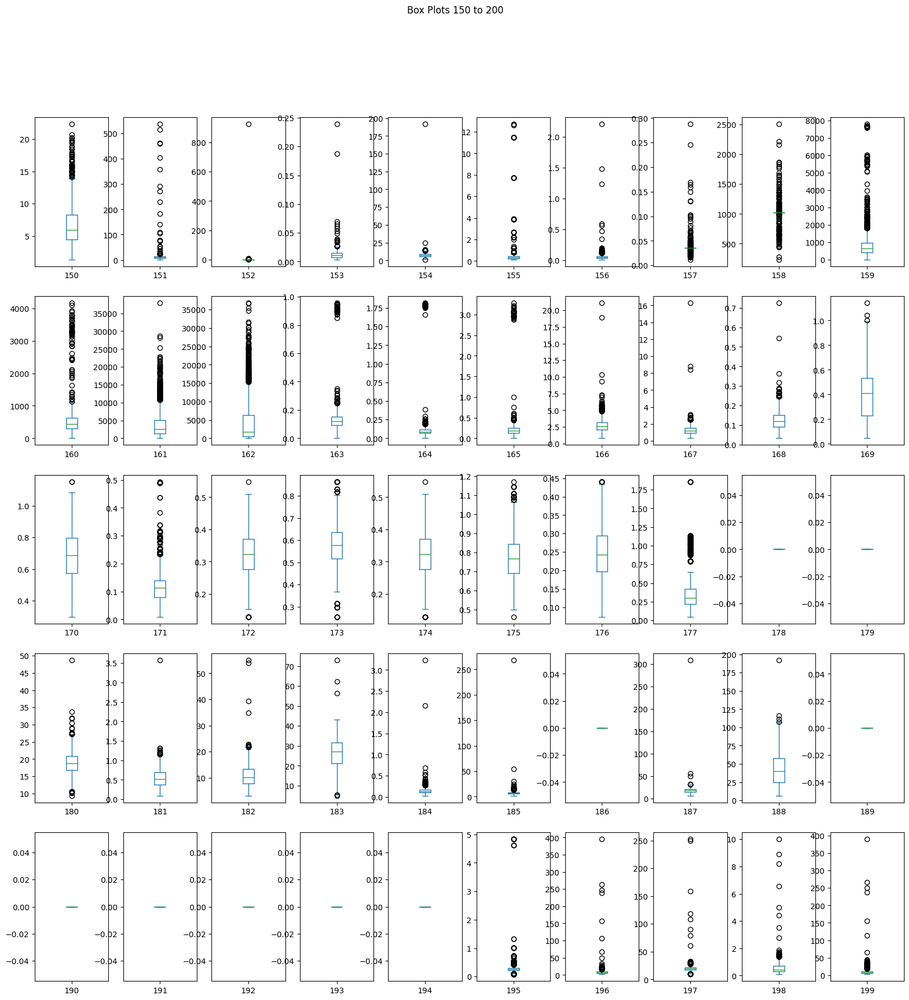

...

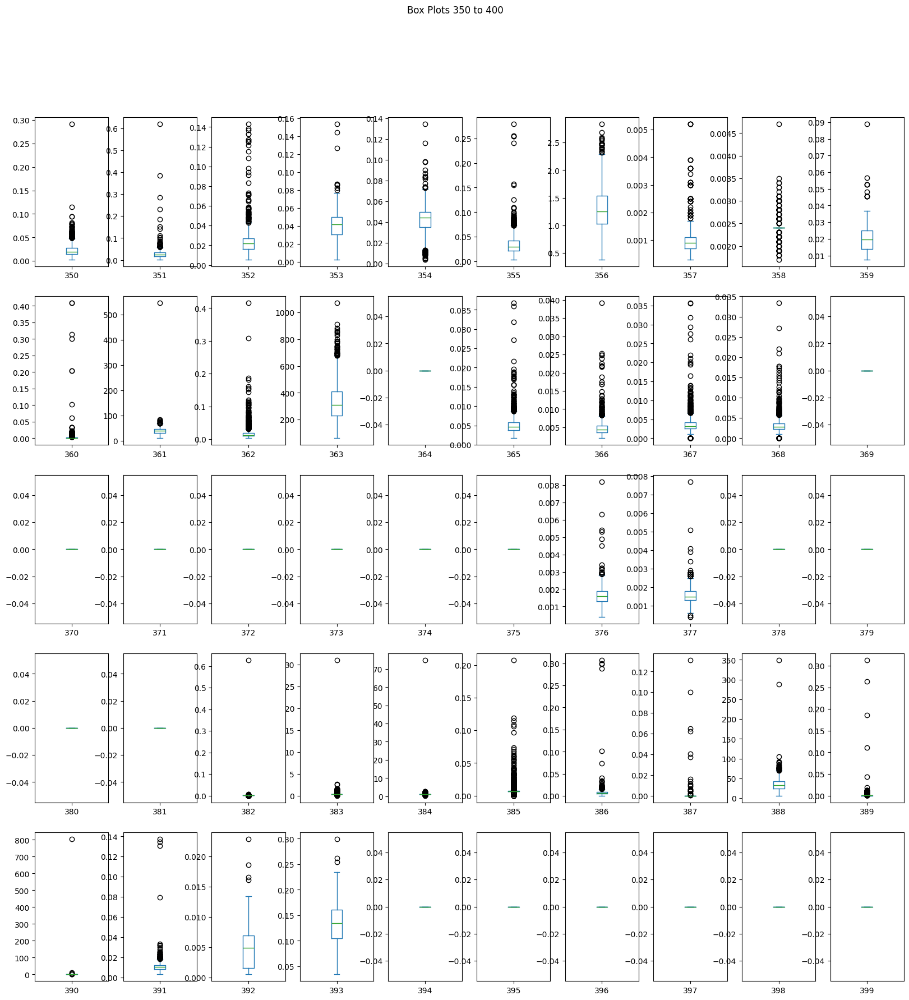

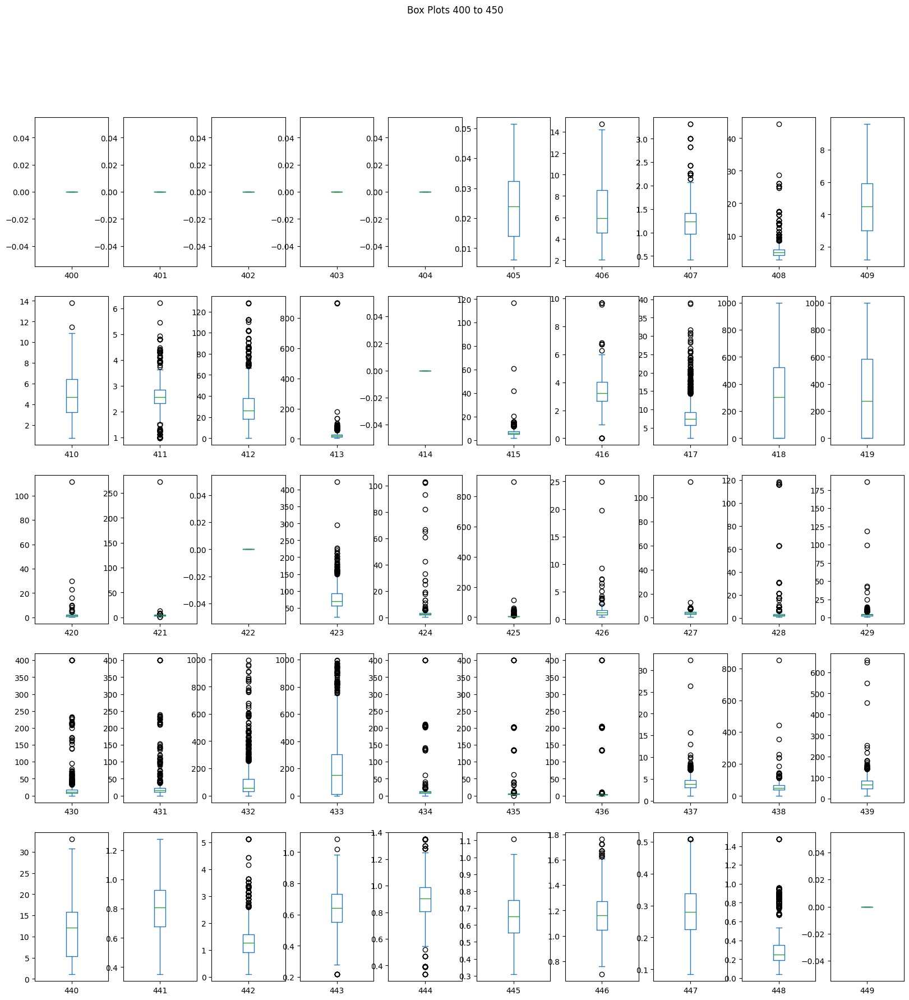

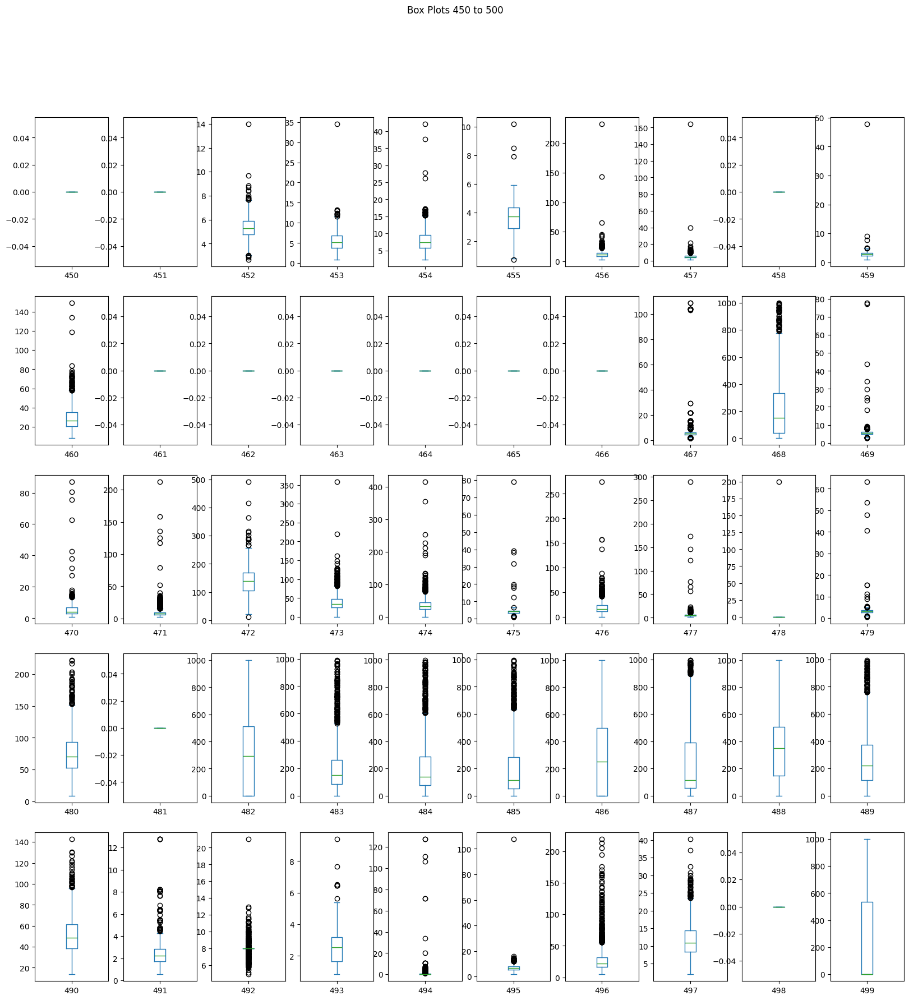

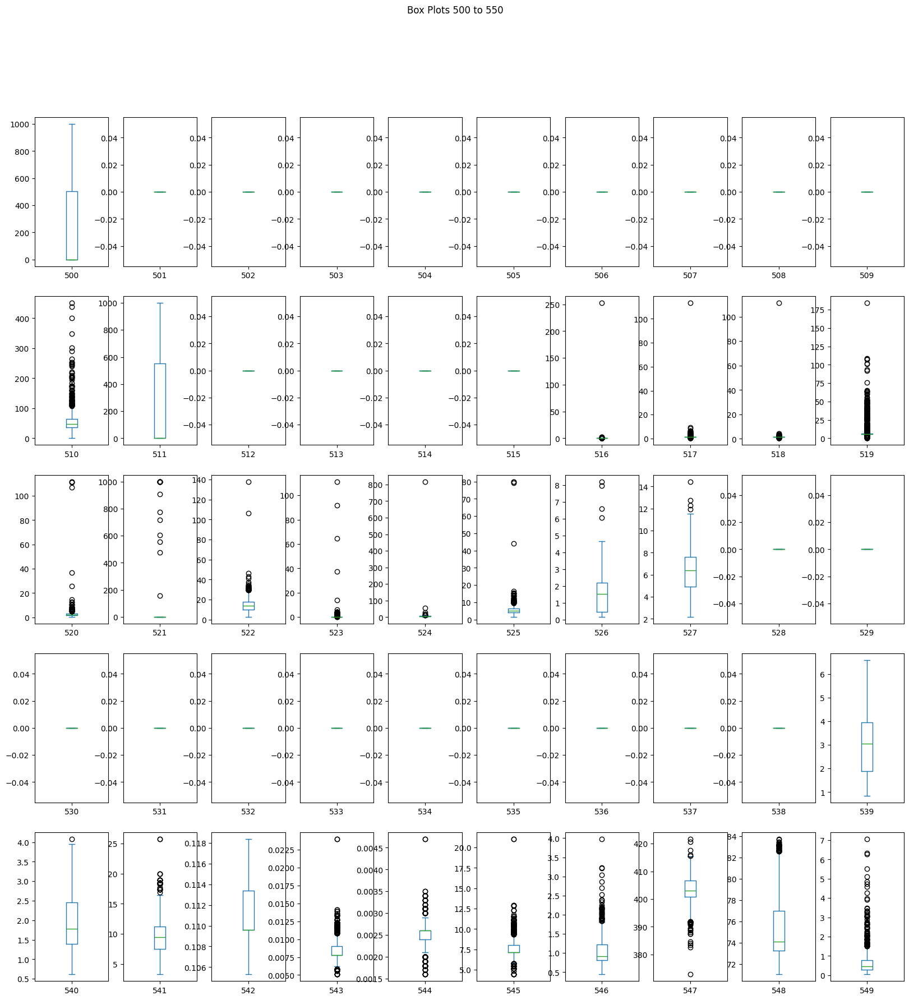

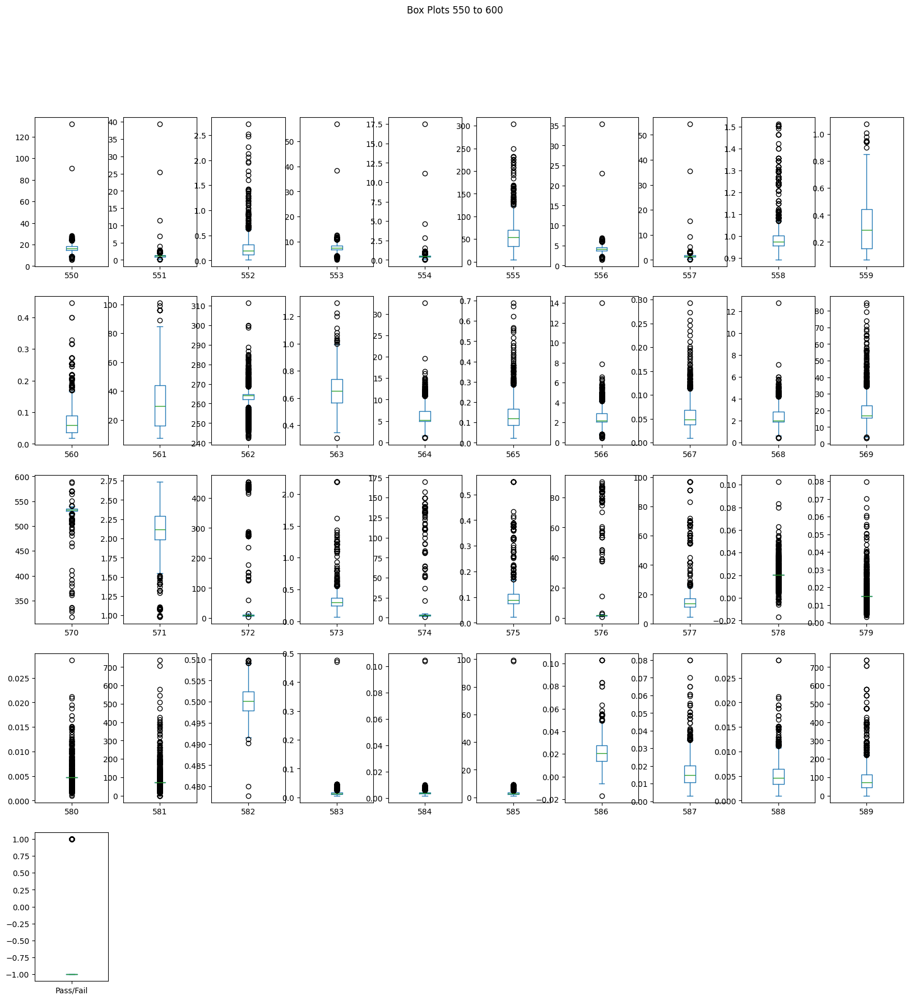

In [7]:
import matplotlib.pyplot as plt
# 1
print("\nUnivariate Analysis - Histograms:")
df[numeric_cols].hist(bins=30, figsize=(20, 15))
plt.suptitle("Histograms")
plt.savefig('histograms.png')
plt.show()

# 2
def plot_box_plots(df, numeric_cols, batch_size=50):
    for i in range(0, len(numeric_cols), batch_size):
        subset = numeric_cols[i:i + batch_size]
        df[subset].plot(kind='box', subplots=True, layout=(int(batch_size/10), 10), figsize=(20, 20), sharex=False, sharey=False)
        plt.suptitle(f"Box Plots {i} to {i + batch_size}")
        plt.savefig(f'box_plots_{i}_{i + batch_size}.png')
        plt.show()
plot_box_plots(df, numeric_cols)

Histograms: Show the frequency distribution of individual numeric features.

Box Plots: Help to identify outliers and the spread of the data.

### Bivariate Analysis:

Bivariate analysis involves examining the relationship between two variables.

In [8]:
print(df.columns)

Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)


##### Scatterplot for col 1 & 2.

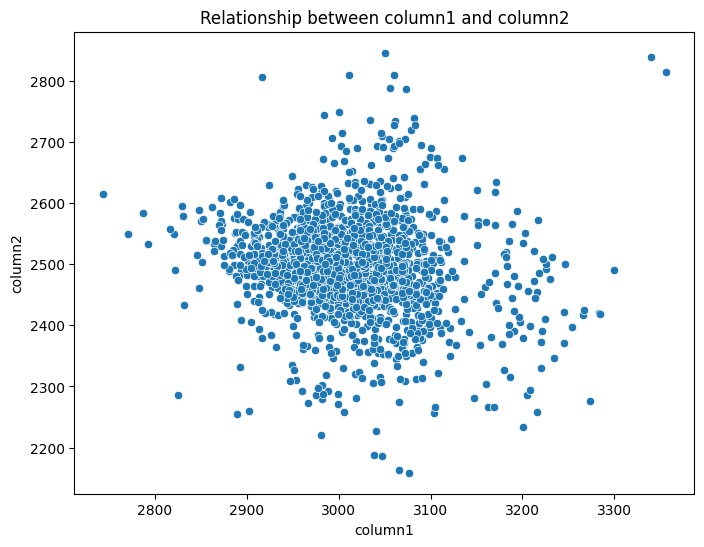

In [9]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['0'], y=df['1'])
plt.title('Relationship between column1 and column2')
plt.xlabel('column1')
plt.ylabel('column2')
plt.show()

##### Scatterplot for col 1 & 3.

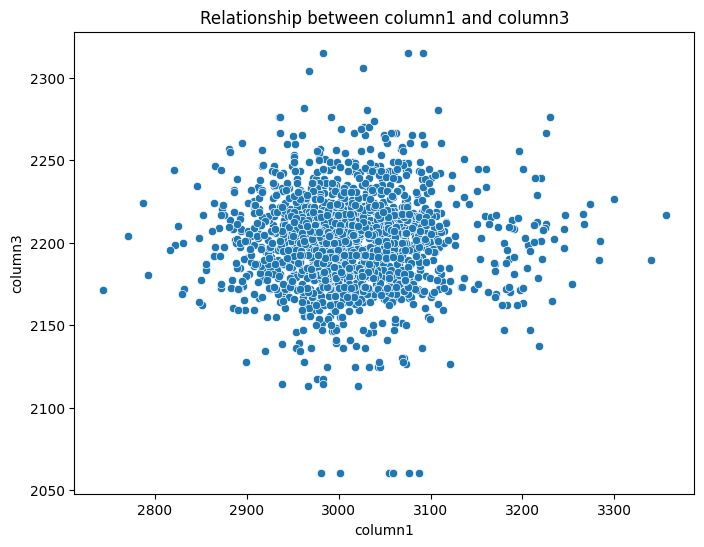

In [10]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['0'], y=df['2'])
plt.title('Relationship between column1 and column3')
plt.xlabel('column1')
plt.ylabel('column3')
plt.show()

##### Scatterplot for col 2 & 3.

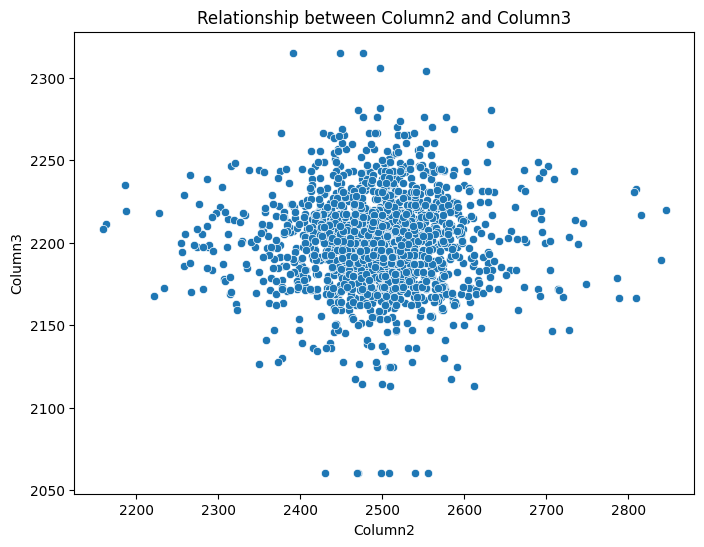

In [11]:
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['1'], y=df['2'])
plt.title('Relationship between Column2 and Column3')
plt.xlabel('Column2')
plt.ylabel('Column3')
plt.show()

### Multivariate Analysis:

Multivariate analysis involves examining the relationships between three or more variables in the dataset.

1) Load and Explore the Data.
2) Preprocess the Data.
3) Scale the Data.
4) Perform Principal Component Analysis (PCA).
5) Perform t-Distributed Stochastic Neighbor Embedding (t-SNE).
6) Perform K-Means Clustering.
7) Evaluate the Clustering.
8) Visualize the results.

Columns in dataset: Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)
Data types:
 Time          object
0            float64
1            float64
2            float64
3            float64
              ...   
586          float64
587          float64
588          float64
589          float64
Pass/Fail      int64
Length: 592, dtype: object
Non-numeric columns: Index(['Time'], dtype='object')
Silhouette score: 0.367


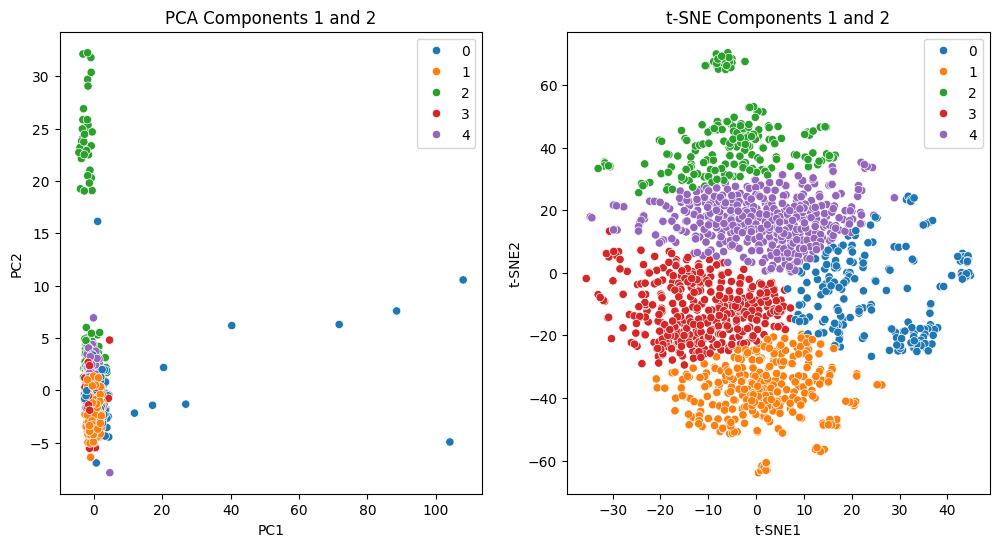

In [12]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
import seaborn as sns
# Step 1 & 2
print("Columns in dataset:", df.columns)
print("Data types:\n", df.dtypes)
non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns
print("Non-numeric columns:", non_numeric_cols)
if 'timestamp_column' in df.columns:
    df['timestamp_column'] = pd.to_datetime(df['timestamp_column']).astype(int) / 10**9 
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])

target_col = 'target'  
if target_col in df.columns:
    df_target = df[target_col]
    df_features = df.drop(columns=[target_col])
else:
    df_features = df
df_features = df_features.dropna(axis=1, how='any')

# Step 3
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_features)

# Step 4
pca = PCA(n_components=0.95)
df_pca = pca.fit_transform(df_scaled)

# Step 5
tsne = TSNE(n_components=2, random_state=42)
df_tsne = tsne.fit_transform(df_pca)

# Step 6
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(df_tsne)

# Step 7
silhouette = silhouette_score(df_tsne, labels)
print(f'Silhouette score: {silhouette:.3f}')

# Step 8
plt.figure(figsize=(12, 6))

# Scatter plot of the PCA components
if df_pca.shape[1] >= 2:
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=df_pca[:, 0], y=df_pca[:, 1], hue=labels, palette='tab10')
    plt.title('PCA Components 1 and 2')
    plt.xlabel('PC1')
    plt.ylabel('PC2')

# Scatter plot of the t-SNE components
plt.subplot(1, 2, 2)
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels, palette='tab10')
plt.title('t-SNE Components 1 and 2')
plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.show()


## 4. Data pre-processing:

• Segregate predictors vs target attributes
• Check for target balancing and fix it if found imbalanced (read SMOTE)
• Perform train-test split and standardise the data or vice versa if required.
• Check if the train and test data have similar statistical characteristics when compared with original data.


1) Load the Data.
2) Convert Datetime Columns and Extract Features.
3) Handle Missing Values.
4) Segregate Predictors and Target Attribute.
5) Balance the Dataset using SMOTE.
6) Perform Train-Test Split.
7) Standardize the Data.

In [13]:
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd
data = pd.read_csv(r'C:\Users\fahee\Project 2\sensor-data.csv')

# Step 2
datetime_columns = ['Time'] 
for col in datetime_columns:
    data[col] = pd.to_datetime(data[col], errors='coerce')
    data[col + '_year'] = data[col].dt.year
    data[col + '_month'] = data[col].dt.month
    data[col + '_day'] = data[col].dt.day
    data[col + '_hour'] = data[col].dt.hour
    data[col + '_minute'] = data[col].dt.minute
    data[col + '_second'] = data[col].dt.second
data = data.drop(datetime_columns, axis=1)

# Step 3
data.fillna(data.mean(), inplace=True)

# Step 4
X = data.drop('Pass/Fail', axis=1)
y = data['Pass/Fail']

# Step 5
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Step 6
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Step 7
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

## 5. Model training, testing and tuning:

• Model training:
- Pick up a supervised learning model.
- Train the model.
- Use cross validation techniques.
- Apply GridSearch hyper-parameter tuning techniques to get the best accuracy.
Suggestion: Use all possible hyper parameter combinations to extract the best 
accuracies.
- Use any other technique/method which can enhance the model performance.
Hint: Dimensionality reduction, attribute removal, standardisation/normalisation, 
target balancing etc.
- Display and explain the classification report in detail.
- Apply the above steps to atleast 3 different kind of models that you have learnt so far
and models that you haven't learned till now (Randomforest, SVM, Naive bayes etc).
• Display and compare all the models designed with their train and test accuracies.
• Select the final best trained model along with your detailed comments for selecting 
this model.
• Save the selected model for future use.

#### We are defining models and smaller grids for GridSearch.

In [14]:
models = {
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [50, 100],
            'max_depth': [None, 10],
            'min_samples_split': [2, 5]
        }
    },
    'SVM': {
        'model': SVC(random_state=42),
        'params': {
            'C': [1, 10],
            'gamma': [0.1, 0.01],
            'kernel': ['rbf']
        }
    },
    'NaiveBayes': {
        'model': GaussianNB(),
        'params': {}
    }
}

#### We are training using 'GridSearch' with fewer folds.

In [15]:
best_models = {}
for model_name, model_info in models.items():
    grid_search = GridSearchCV(model_info['model'], model_info['params'], cv=3, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_scaled, y_train)
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best parameters for SVM: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for NaiveBayes: {}


#### We now use 'RandomizedSearchCV' instead of 'GridSearchCV' for getting the best models.

In [16]:
from sklearn.model_selection import RandomizedSearchCV
best_models = {}
for model_name, model_info in models.items():
    random_search = RandomizedSearchCV(model_info['model'], model_info['params'], n_iter=10, cv=3, n_jobs=-1, verbose=1, random_state=42)
    random_search.fit(X_train_scaled, y_train)
    best_models[model_name] = random_search.best_estimator_
    print(f"Best parameters for {model_name}: {random_search.best_params_}")


Fitting 3 folds for each of 8 candidates, totalling 24 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for RandomForest: {'n_estimators': 100, 'min_samples_split': 2, 'max_depth': None}
Fitting 3 folds for each of 4 candidates, totalling 12 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for SVM: {'kernel': 'rbf', 'gamma': 0.01, 'C': 10}
Fitting 3 folds for each of 1 candidates, totalling 3 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 1 is smaller than n_iter=10. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for NaiveBayes: {}


#### Using 'RandomForest' model and looping through the model, we are predicting using the model and creating a classification report.

In [17]:
for model_name, model in best_models.items():
    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)
    print(f"\n{model_name} Model")
    print("Train Accuracy:", accuracy_score(y_train, y_pred_train))
    print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
    print("Confusion Matrix (Test):\n", confusion_matrix(y_test, y_pred_test))
    print("Classification Report (Test):\n", classification_report(y_test, y_pred_test))


RandomForest Model
Train Accuracy: 1.0
Test Accuracy: 0.9982935153583617
Confusion Matrix (Test):
 [[305   1]
 [  0 280]]
Classification Report (Test):
               precision    recall  f1-score   support

          -1       1.00      1.00      1.00       306
           1       1.00      1.00      1.00       280

    accuracy                           1.00       586
   macro avg       1.00      1.00      1.00       586
weighted avg       1.00      1.00      1.00       586


SVM Model
Train Accuracy: 1.0
Test Accuracy: 0.9965870307167235
Confusion Matrix (Test):
 [[306   0]
 [  2 278]]
Classification Report (Test):
               precision    recall  f1-score   support

          -1       0.99      1.00      1.00       306
           1       1.00      0.99      1.00       280

    accuracy                           1.00       586
   macro avg       1.00      1.00      1.00       586
weighted avg       1.00      1.00      1.00       586


NaiveBayes Model
Train Accuracy: 0.62051282051

#### Splitting the dataset into training and testing sets.

In [18]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print("First few rows of the scaled training data:\n", pd.DataFrame(X_train_scaled, columns=X.columns).head())

First few rows of the scaled training data:
           0         1         2         3         4    5         6         7  \
0 -1.117318  0.326784 -0.420002  0.049986 -0.032339  0.0 -0.921063 -0.077624   
1 -0.344217 -2.020821  1.329942  0.798405 -0.040746  0.0 -0.080768 -0.144817   
2 -0.328065 -0.190363  0.178879 -0.271886 -0.036845  0.0  0.049681  0.130541   
3 -0.373047  1.859457 -0.462347 -0.280275 -0.032899  0.0  0.236997  0.188569   
4 -0.640140  0.909195 -1.628441 -0.802872 -0.049169  0.0  0.042402  0.306100   

          8         9        10        11        12   13        14        15  \
0  0.914276  0.693843 -0.270965  0.286979 -0.873959  0.0  0.797520  0.217119   
1 -0.145078  1.252977  1.015671  0.273918 -0.042963  0.0 -0.239173 -0.346865   
2  0.026167  1.581396  0.248839  0.918802 -2.772287  0.0  1.034504 -0.285266   
3 -0.000890 -0.514514  0.828501  0.455027 -1.626097  0.0  2.098989  0.900015   
4  1.149033  0.785054 -0.768098 -0.978541  0.158928  0.0  0.708632  0.3020

The code standardizes the data using 'StandardScaler'. Standardization scales the features so that they have a mean of 0 and a standard deviation of 1, which is important for many machine learning algorithms.

#### Comparing all the statistical characteristics and selecting the final best trained model.

In [19]:
original_stats = X.describe()
train_stats = pd.DataFrame(X_train_scaled, columns=X.columns).describe()
test_stats = pd.DataFrame(X_test_scaled, columns=X.columns).describe()
print("Original Data Statistics:\n", original_stats)
print("\nTraining Data Statistics:\n", train_stats)
print("\nTesting Data Statistics:\n", test_stats)

Original Data Statistics:
                  0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.452896  2495.850231  2200.547318  1396.376627     4.197013   
std      73.480613    80.227793    29.380932   439.712852    56.103066   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  2181.099950  1083.885800     1.017700   
50%    3011.840000  2498.910000  2200.955600  1287.353800     1.317100   
75%    3056.540000  2538.745000  2218.055500  1590.169900     1.529600   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  \
count  1567.0  1567.000000  1567.000000  1567.000000  1567.000000   
mean    100.0   101.112908     0.121822     1.462862    -0.000841   
std       0.0     6.209271     0.008936     0.073849     0.015107   
min     100.0    82.131100    

#### Saving the model for future use.

1) Loading the data.
2) Defining and preparing the features and target variables.
3) Splitting the data into training and testing sets.
4) Standardizing the data.
5) Displaying statistics.
6) Training a model.
7) Saving the model and the scaler.

###### Here, we are training a RandomForestClassifier on the scaled training data.

In [21]:
import pandas as pd
import joblib
from sklearn.ensemble import RandomForestClassifier
original_stats = X.describe()
train_stats = pd.DataFrame(X_train_scaled, columns=X.columns).describe()
test_stats = pd.DataFrame(X_test_scaled, columns=X.columns).describe()
print("Original Data Statistics:\n", original_stats)
print("\nTraining Data Statistics:\n", train_stats)
print("\nTesting Data Statistics:\n", test_stats)

# Train a RandomForestClassifier
model = RandomForestClassifier(random_state=42)
model.fit(X_train_scaled, y_train)

# Saving the trained model to a file
model_filename = 'random_forest_model.joblib'
joblib.dump(model, model_filename)
print(f"Model saved to {model_filename}")

Original Data Statistics:
                  0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.452896  2495.850231  2200.547318  1396.376627     4.197013   
std      73.480613    80.227793    29.380932   439.712852    56.103066   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  2181.099950  1083.885800     1.017700   
50%    3011.840000  2498.910000  2200.955600  1287.353800     1.317100   
75%    3056.540000  2538.745000  2218.055500  1590.169900     1.529600   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  \
count  1567.0  1567.000000  1567.000000  1567.000000  1567.000000   
mean    100.0   101.112908     0.121822     1.462862    -0.000841   
std       0.0     6.209271     0.008936     0.073849     0.015107   
min     100.0    82.131100    

### Hence, this is the block of full code from the beginning till the end as per the tasks.

                  Time        0        1          2          3       4      5  \
0  2008-07-19 11:55:00  3030.93  2564.00  2187.7333  1411.1265  1.3602  100.0   
1  2008-07-19 12:32:00  3095.78  2465.14  2230.4222  1463.6606  0.8294  100.0   
2  2008-07-19 13:17:00  2932.61  2559.94  2186.4111  1698.0172  1.5102  100.0   
3  2008-07-19 14:43:00  2988.72  2479.90  2199.0333   909.7926  1.3204  100.0   
4  2008-07-19 15:22:00  3032.24  2502.87  2233.3667  1326.5200  1.5334  100.0   

          6       7       8       9      10      11        12   13       14  \
0   97.6133  0.1242  1.5005  0.0162 -0.0034  0.9455  202.4396  0.0   7.9558   
1  102.3433  0.1247  1.4966 -0.0005 -0.0148  0.9627  200.5470  0.0  10.1548   
2   95.4878  0.1241  1.4436  0.0041  0.0013  0.9615  202.0179  0.0   9.5157   
3  104.2367  0.1217  1.4882 -0.0124 -0.0033  0.9629  201.8482  0.0   9.6052   
4  100.3967  0.1235  1.5031 -0.0031 -0.0072  0.9569  201.9424  0.0  10.5661   

         15       16      17        18

C:\Users\fahee\AppData\Local\Temp\ipykernel_18172\342144746.py:30: FutureWarning: DataFrame.fillna with 'method' is deprecated and will raise in a future version. Use obj.ffill() or obj.bfill() instead.
  data[non_numeric_columns] = data[non_numeric_columns].fillna(method='ffill')


Missing values after imputation:
 Series([], dtype: int64)
Statistical Summary:
                  0            1            2            3            4  \
count  1567.000000  1567.000000  1567.000000  1567.000000  1567.000000   
mean   3014.452896  2495.850231  2200.547318  1396.376627     4.197013   
std      73.480613    80.227793    29.380932   439.712852    56.103066   
min    2743.240000  2158.750000  2060.660000     0.000000     0.681500   
25%    2966.665000  2452.885000  2181.099950  1083.885800     1.017700   
50%    3011.840000  2498.910000  2200.955600  1287.353800     1.317100   
75%    3056.540000  2538.745000  2218.055500  1590.169900     1.529600   
max    3356.350000  2846.440000  2315.266700  3715.041700  1114.536600   

            5            6            7            8            9  \
count  1567.0  1567.000000  1567.000000  1567.000000  1567.000000   
mean    100.0   101.112908     0.121822     1.462862    -0.000841   
std       0.0     6.209271     0.008936     0

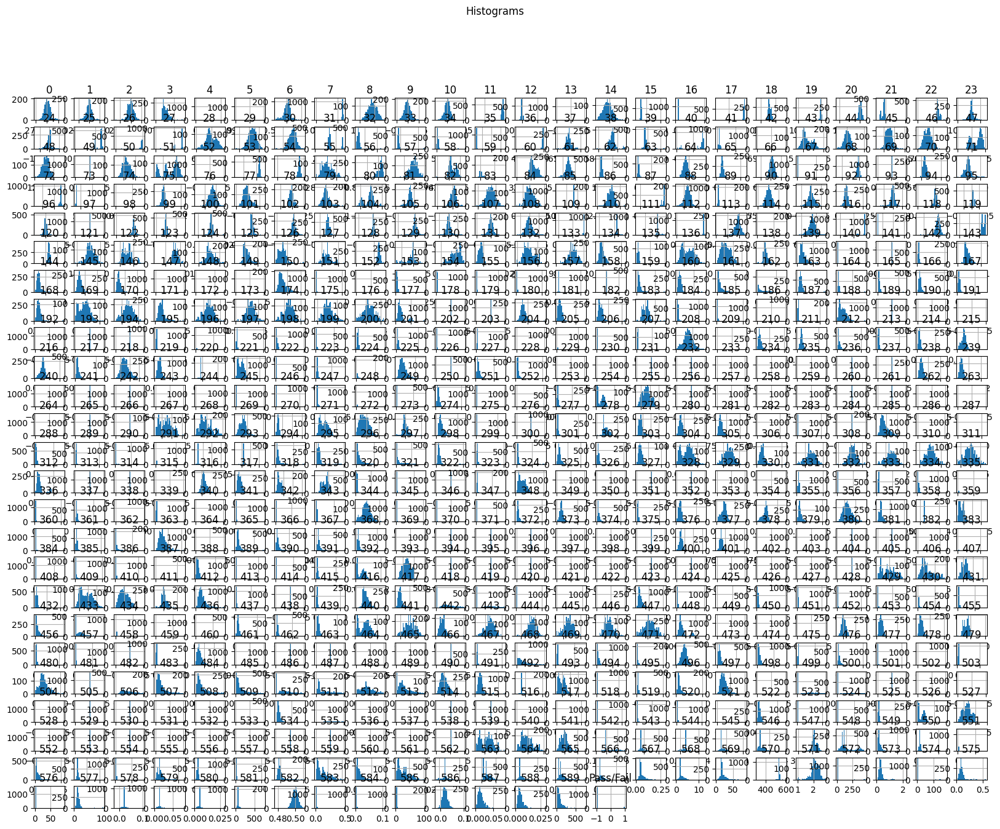

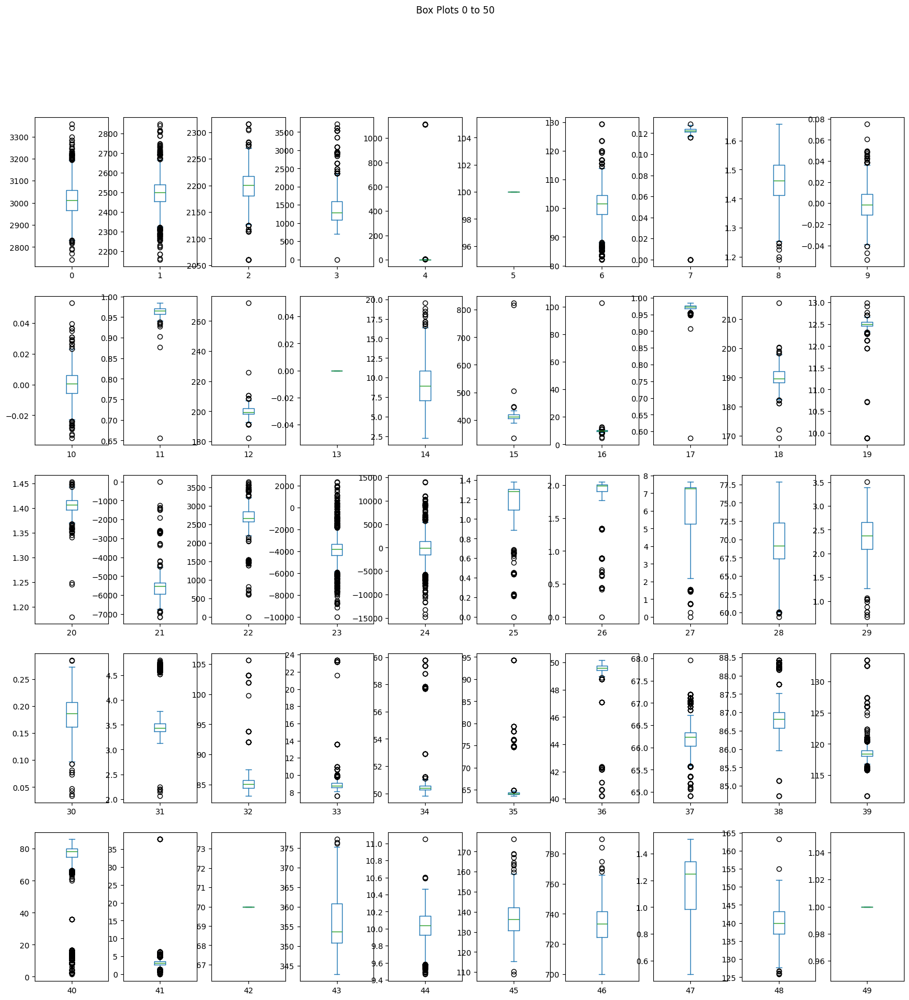

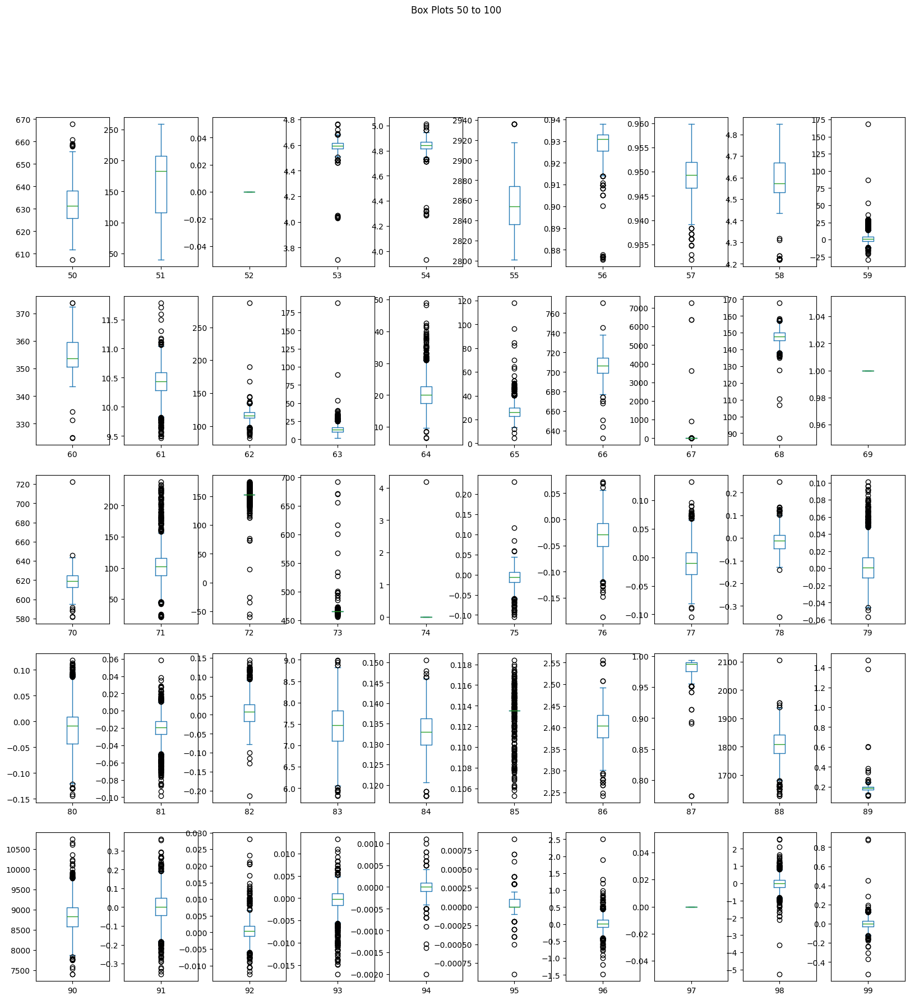

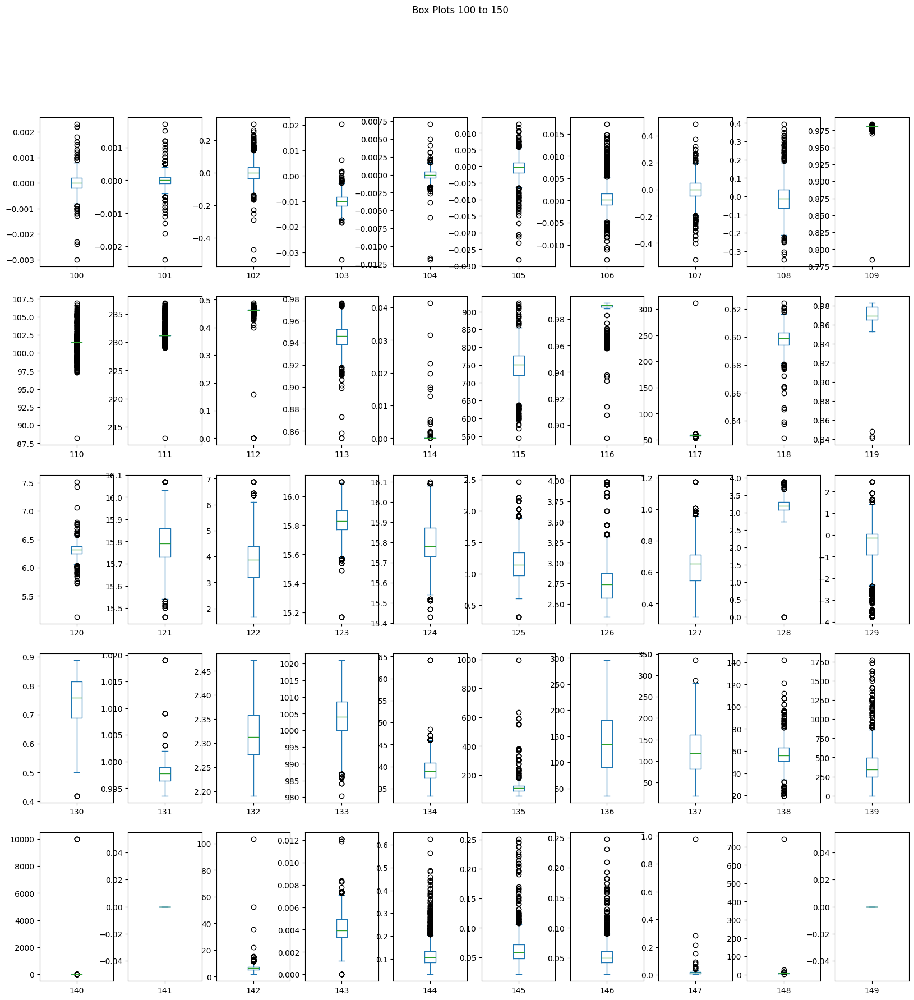

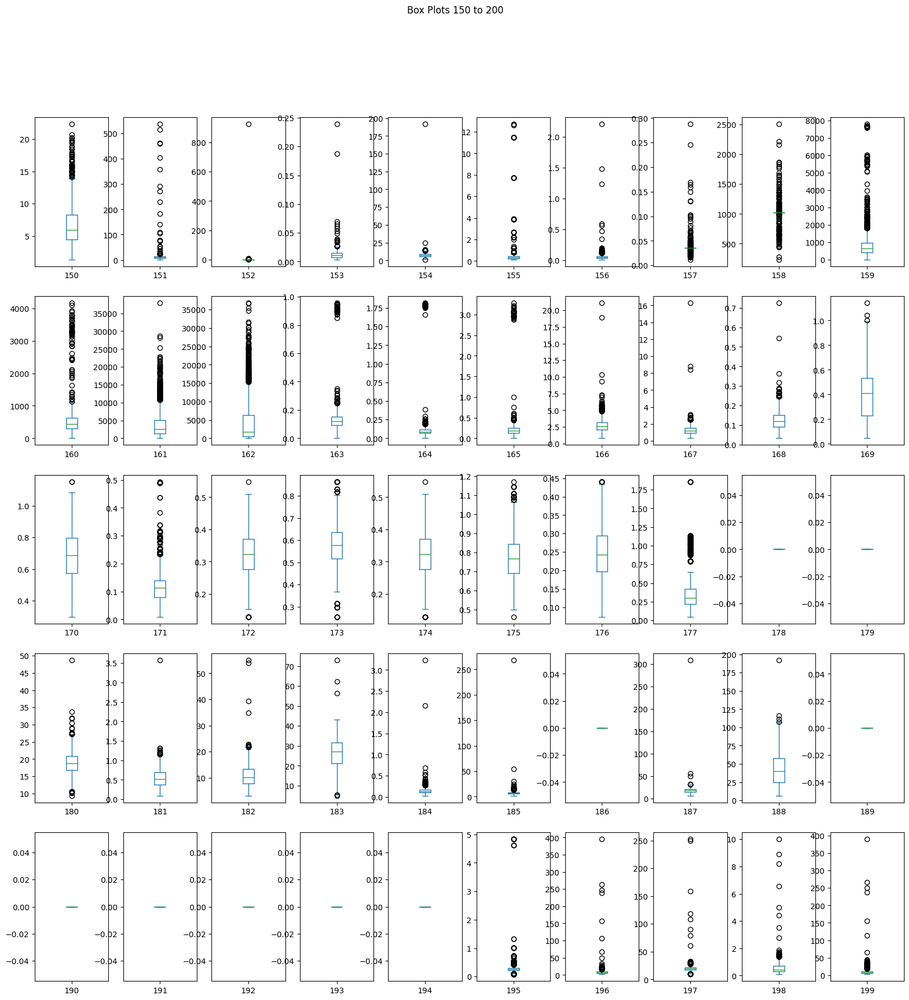

...

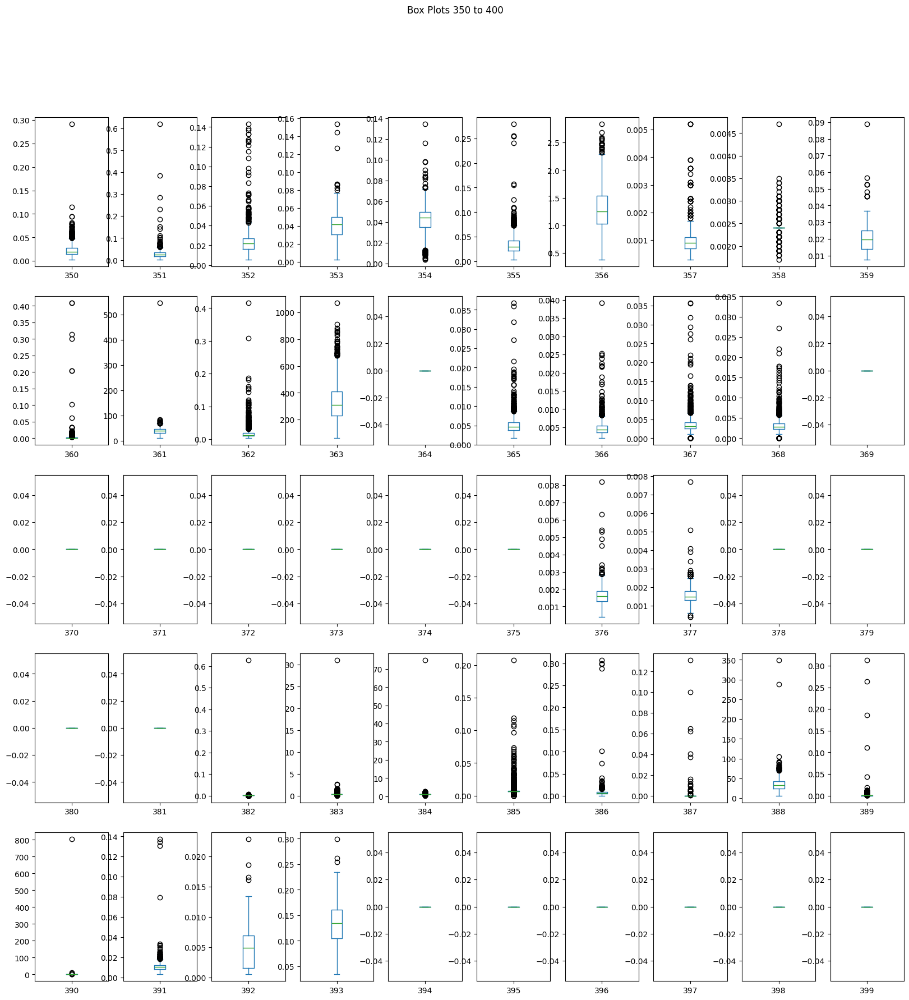

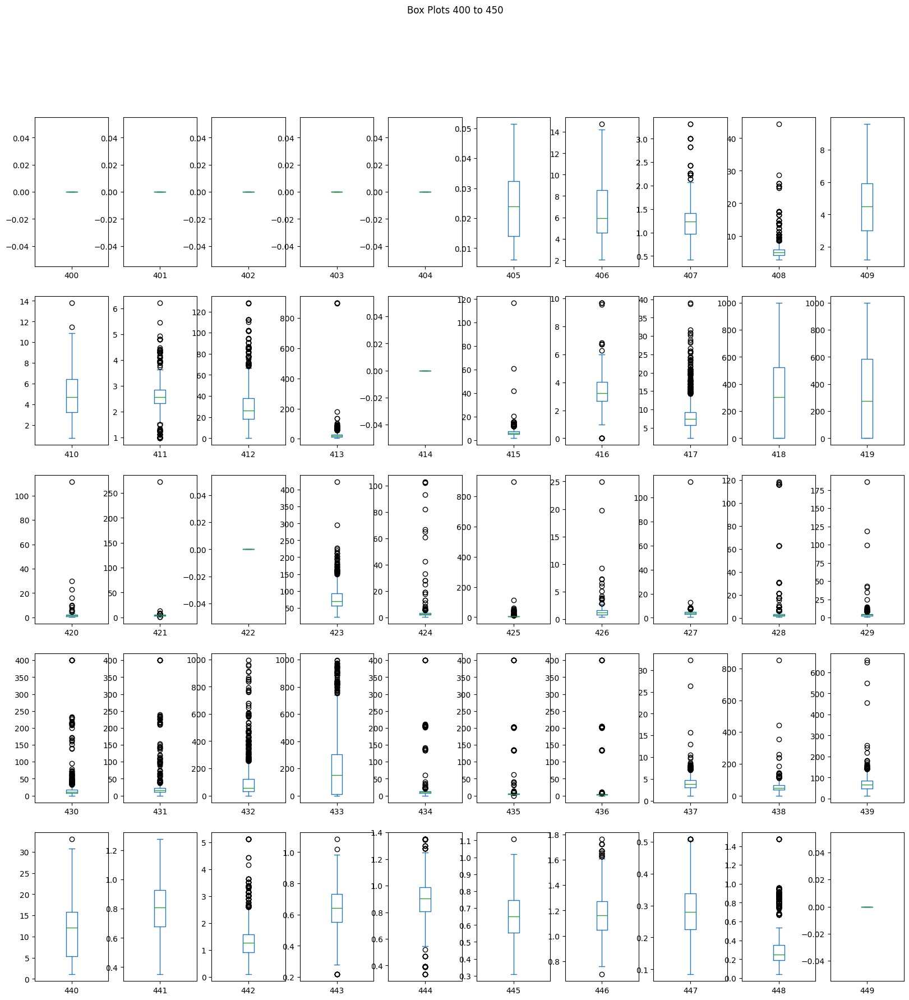

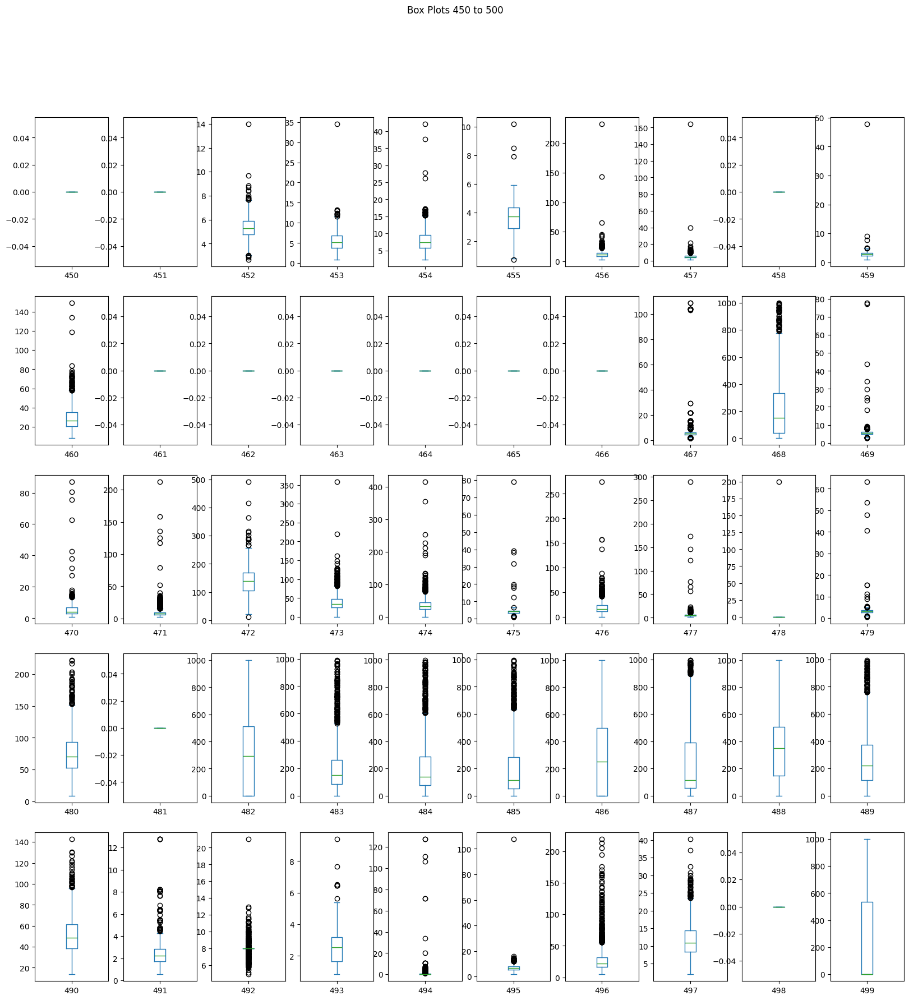

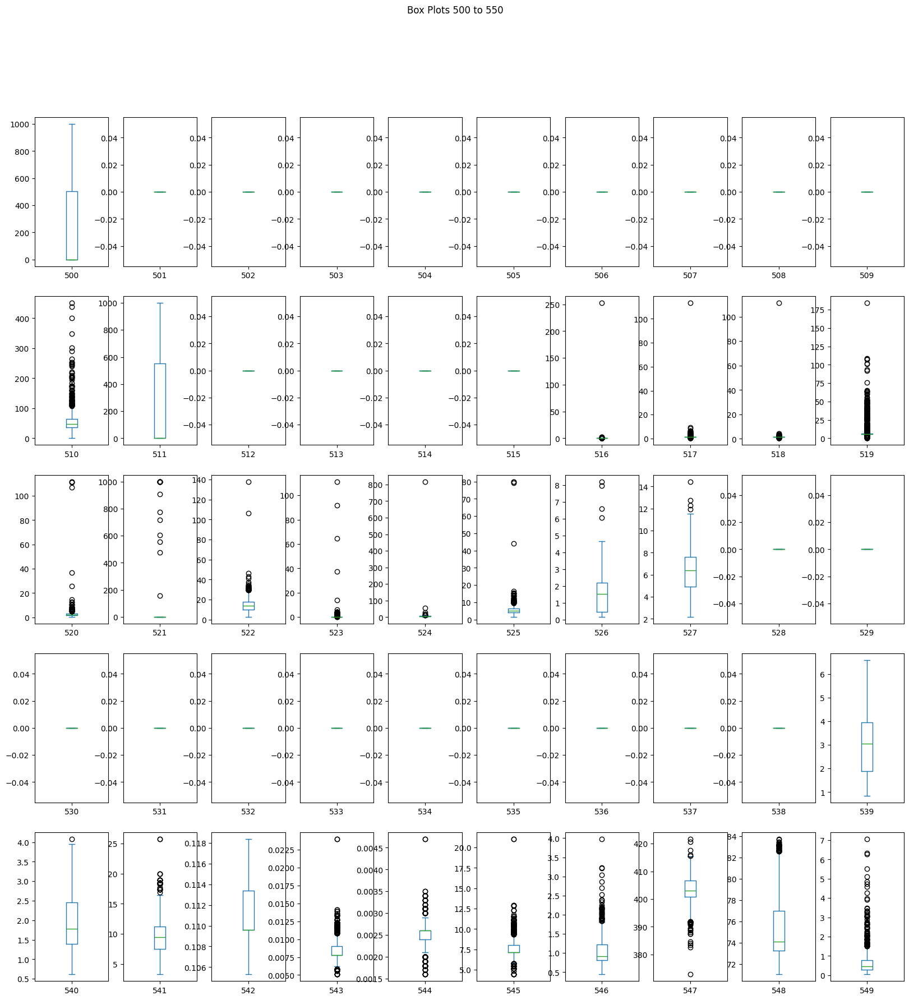

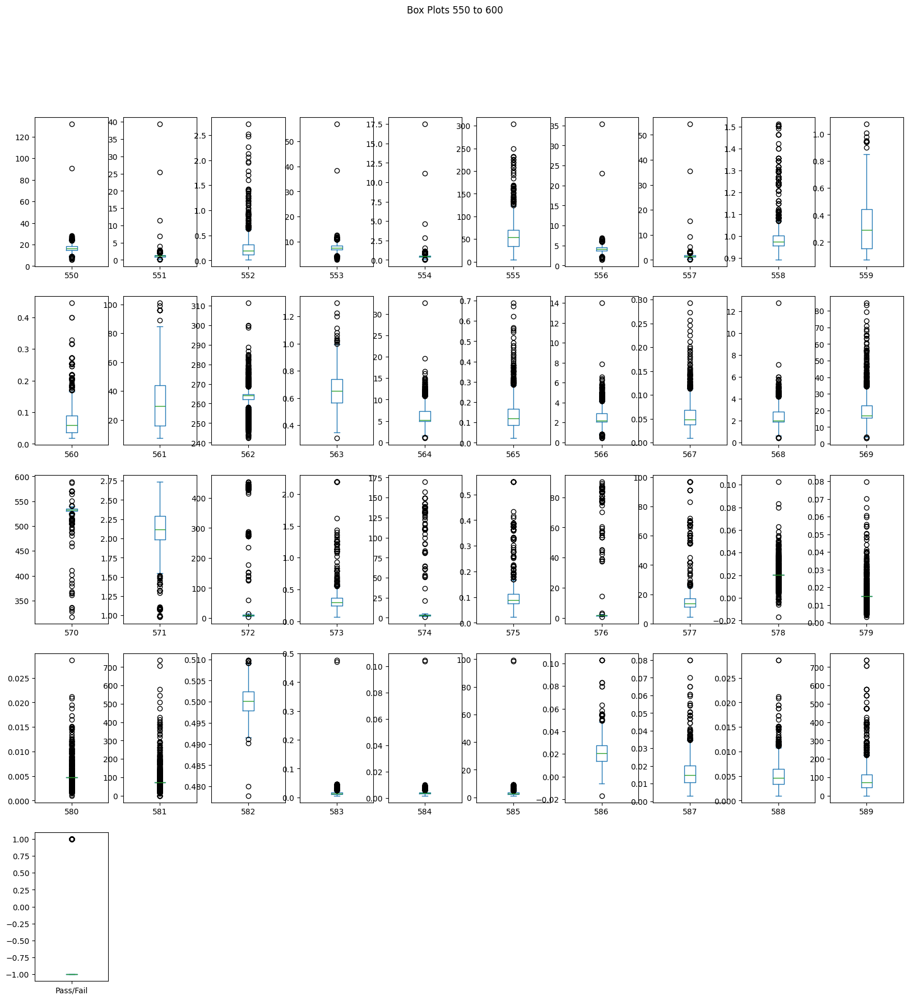

Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)


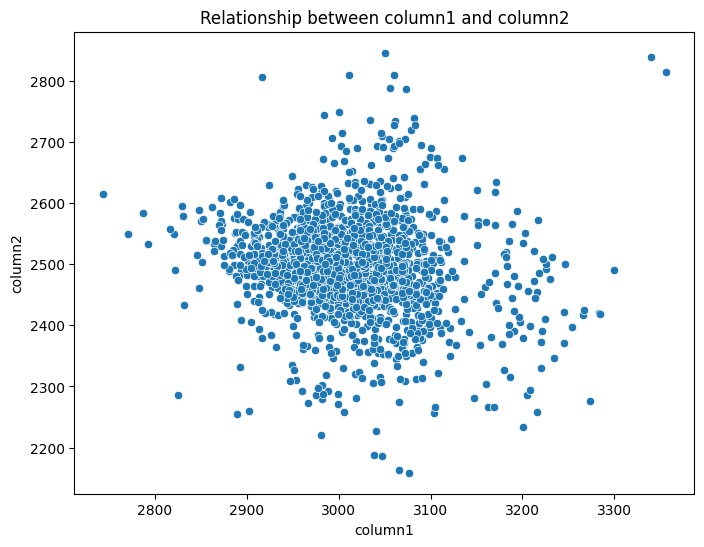

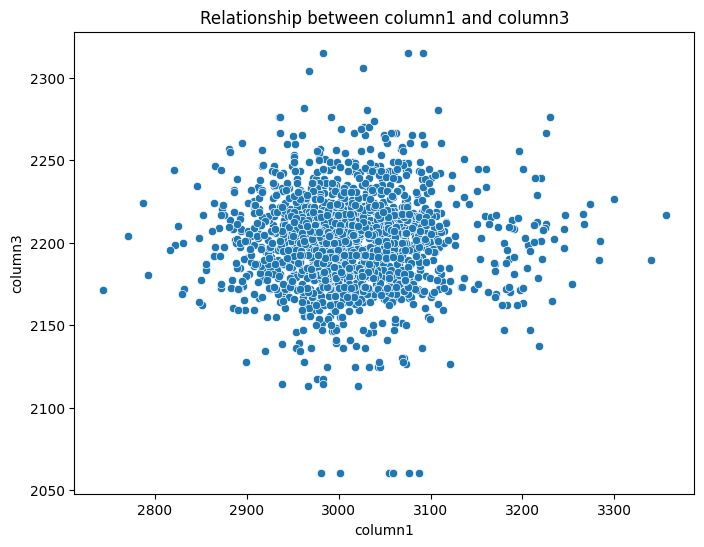

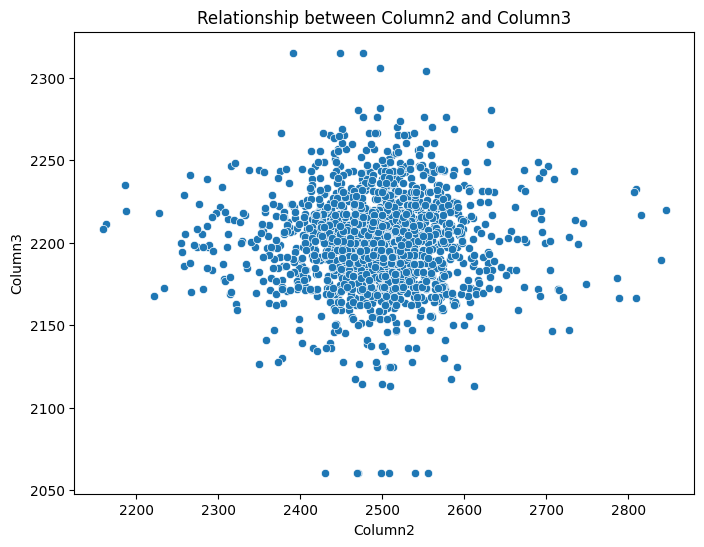

Columns in dataset: Index(['Time', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '581', '582', '583', '584', '585', '586', '587', '588', '589',
       'Pass/Fail'],
      dtype='object', length=592)
Data types:
 Time          object
0            float64
1            float64
2            float64
3            float64
              ...   
586          float64
587          float64
588          float64
589          float64
Pass/Fail      int64
Length: 592, dtype: object
Non-numeric columns: Index(['Time'], dtype='object')
Silhouette score: 0.367


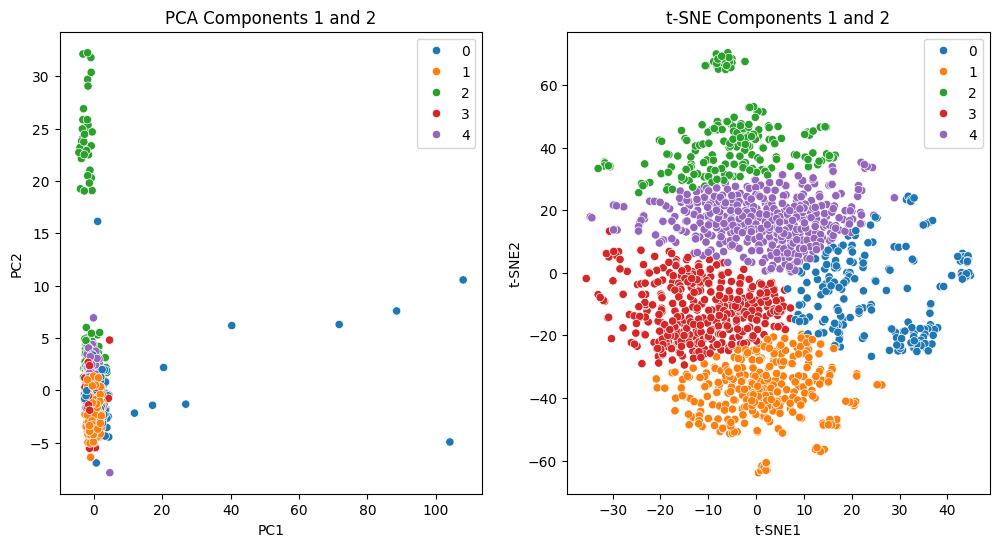

Fitting 3 folds for each of 8 candidates, totalling 24 fits
Best parameters for RandomForest: {'max_depth': None, 'min_samples_split': 2, 'n_estimators': 100}
Fitting 3 folds for each of 4 candidates, totalling 12 fits
Best parameters for SVM: {'C': 10, 'gamma': 0.01, 'kernel': 'rbf'}
Fitting 3 folds for each of 1 candidates, totalling 3 fits
Best parameters for NaiveBayes: {}
Fitting 3 folds for each of 8 candidates, totalling 24 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 8 is smaller than n_iter=10. Running 8 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for RandomForest: {'n_estimators': 100, 'min_samples_split': 2, 'max_depth': None}
Fitting 3 folds for each of 4 candidates, totalling 12 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 4 is smaller than n_iter=10. Running 4 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for SVM: {'kernel': 'rbf', 'gamma': 0.01, 'C': 10}
Fitting 3 folds for each of 1 candidates, totalling 3 fits


C:\Users\fahee\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\LocalCache\local-packages\Python311\site-packages\sklearn\model_selection\_search.py:320: UserWarning: The total space of parameters 1 is smaller than n_iter=10. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  warnings.warn(


Best parameters for NaiveBayes: {}

RandomForest Model
Train Accuracy: 1.0
Test Accuracy: 0.9982935153583617
Confusion Matrix (Test):
 [[305   1]
 [  0 280]]
Classification Report (Test):
               precision    recall  f1-score   support

          -1       1.00      1.00      1.00       306
           1       1.00      1.00      1.00       280

    accuracy                           1.00       586
   macro avg       1.00      1.00      1.00       586
weighted avg       1.00      1.00      1.00       586


SVM Model
Train Accuracy: 1.0
Test Accuracy: 0.9965870307167235
Confusion Matrix (Test):
 [[306   0]
 [  2 278]]
Classification Report (Test):
               precision    recall  f1-score   support

          -1       0.99      1.00      1.00       306
           1       1.00      0.99      1.00       280

    accuracy                           1.00       586
   macro avg       1.00      1.00      1.00       586
weighted avg       1.00      1.00      1.00       586


NaiveBayes 

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import joblib
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from imblearn.over_sampling import SMOTE
from collections import Counter
from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import train_test_split

data = pd.read_csv(r'C:\Users\fahee\Project 2\sensor-data.csv')
print(data.head())
print(data.info())
print(data.describe())
missing_values = data.isnull().sum()
print("Missing values in each column:\n", missing_values[missing_values > 0])
numeric_columns = data.select_dtypes(include=[np.number]).columns
non_numeric_columns = data.select_dtypes(exclude=[np.number]).columns
data[numeric_columns] = data[numeric_columns].fillna(data[numeric_columns].mean())
data[non_numeric_columns] = data[non_numeric_columns].fillna(method='ffill')
missing_values_after_imputation = data.isnull().sum()
print("Missing values after imputation:\n", missing_values_after_imputation[missing_values_after_imputation > 0])
statistical_summary = data.describe()
print("Statistical Summary:\n", statistical_summary)

df = pd.read_csv(r"C:\Users\fahee\Project 2\sensor-data.csv")
missing_values = df.isnull().sum()
print("Missing values per column before cleaning:")
print(missing_values[missing_values > 0])
numeric_cols = df.select_dtypes(include=['number']).columns
non_numeric_cols = df.select_dtypes(exclude=['number']).columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())
for col in non_numeric_cols:
    df[col] = df[col].fillna(df[col].mode()[0])
df.dropna(axis=1, thresh=int(0.8 * len(df)), inplace=True)
df.dropna(inplace=True)
print("Missing values per column after cleaning:")
print(df.isnull().sum())
print(df.info())
print(df.describe())
print(df.head())
descriptive_stats = df[numeric_cols].describe()
print("\nDescriptive Statistics:")
pd.set_option('display.max_columns', None)
print(descriptive_stats)
correlation_matrix = df[numeric_cols].corr()
print("\nCorrelation Matrix:")
print(correlation_matrix)
print("\nUnivariate Analysis - Histograms:")
df[numeric_cols].hist(bins=30, figsize=(20, 15))
plt.suptitle("Histograms")
plt.savefig('histograms.png')
plt.show()
def plot_box_plots(df, numeric_cols, batch_size=50):
    for i in range(0, len(numeric_cols), batch_size):
        subset = numeric_cols[i:i + batch_size]
        df[subset].plot(kind='box', subplots=True, layout=(int(batch_size/10), 10), figsize=(20, 20), sharex=False, sharey=False)
        plt.suptitle(f"Box Plots {i} to {i + batch_size}")
        plt.savefig(f'box_plots_{i}_{i + batch_size}.png')
        plt.show()
plot_box_plots(df, numeric_cols)

print(df.columns)
plt.figure(figsize=(8,6))
sns.scatterplot(x=df['0'], y=df['1'])
plt.title('Relationship between column1 and column2')
plt.xlabel('column1')
plt.ylabel('column2')
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(x=df['0'], y=df['2'])
plt.title('Relationship between column1 and column3')
plt.xlabel('column1')
plt.ylabel('column3')
plt.show()

plt.figure(figsize=(8,6))
sns.scatterplot(x=df['1'], y=df['2'])
plt.title('Relationship between Column2 and Column3')
plt.xlabel('Column2')
plt.ylabel('Column3')
plt.show()

print("Columns in dataset:", df.columns)
print("Data types:\n", df.dtypes)
non_numeric_cols = df.select_dtypes(exclude=[np.number]).columns
print("Non-numeric columns:", non_numeric_cols)
if 'timestamp_column' in df.columns:
    df['timestamp_column'] = pd.to_datetime(df['timestamp_column']).astype(int) / 10**9 
categorical_cols = df.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
target_col = 'target'  
if target_col in df.columns:
    df_target = df[target_col]
    df_features = df.drop(columns=[target_col])
else:
    df_features = df
df_features = df_features.dropna(axis=1, how='any')
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_features)
pca = PCA(n_components=0.95)
df_pca = pca.fit_transform(df_scaled)
tsne = TSNE(n_components=2, random_state=42)
df_tsne = tsne.fit_transform(df_pca)
kmeans = KMeans(n_clusters=5, random_state=42)
labels = kmeans.fit_predict(df_tsne)
silhouette = silhouette_score(df_tsne, labels)
print(f'Silhouette score: {silhouette:.3f}')
plt.figure(figsize=(12, 6))
if df_pca.shape[1] >= 2:
    plt.subplot(1, 2, 1)
    sns.scatterplot(x=df_pca[:, 0], y=df_pca[:, 1], hue=labels, palette='tab10')
    plt.title('PCA Components 1 and 2')
    plt.xlabel('PC1')
    plt.ylabel('PC2')
plt.subplot(1, 2, 2)
sns.scatterplot(x=df_tsne[:, 0], y=df_tsne[:, 1], hue=labels, palette='tab10')
plt.title('t-SNE Components 1 and 2')
plt.xlabel('t-SNE1')
plt.ylabel('t-SNE2')
plt.show()

data = pd.read_csv(r'C:\Users\fahee\Project 2\sensor-data.csv')
datetime_columns = ['Time'] 
for col in datetime_columns:
    data[col] = pd.to_datetime(data[col], errors='coerce')
    data[col + '_year'] = data[col].dt.year
    data[col + '_month'] = data[col].dt.month
    data[col + '_day'] = data[col].dt.day
    data[col + '_hour'] = data[col].dt.hour
    data[col + '_minute'] = data[col].dt.minute
    data[col + '_second'] = data[col].dt.second
data = data.drop(datetime_columns, axis=1)
data.fillna(data.mean(), inplace=True)
X = data.drop('Pass/Fail', axis=1)
y = data['Pass/Fail']
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

models = {
    'RandomForest': {
        'model': RandomForestClassifier(random_state=42),
        'params': {
            'n_estimators': [50, 100],
            'max_depth': [None, 10],
            'min_samples_split': [2, 5]
        }
    },
    'SVM': {
        'model': SVC(random_state=42),
        'params': {
            'C': [1, 10],
            'gamma': [0.1, 0.01],
            'kernel': ['rbf']
        }
    },
    'NaiveBayes': {
        'model': GaussianNB(),
        'params': {}
    }
}
best_models = {}
for model_name, model_info in models.items():
    grid_search = GridSearchCV(model_info['model'], model_info['params'], cv=3, n_jobs=-1, verbose=1)
    grid_search.fit(X_train_scaled, y_train)
    best_models[model_name] = grid_search.best_estimator_
    print(f"Best parameters for {model_name}: {grid_search.best_params_}")

best_models = {}
for model_name, model_info in models.items():
    random_search = RandomizedSearchCV(model_info['model'], model_info['params'], n_iter=10, cv=3, n_jobs=-1, verbose=1, random_state=42)
    random_search.fit(X_train_scaled, y_train)
    best_models[model_name] = random_search.best_estimator_
    print(f"Best parameters for {model_name}: {random_search.best_params_}")

for model_name, model in best_models.items():
    y_pred_train = model.predict(X_train_scaled)
    y_pred_test = model.predict(X_test_scaled)
    print(f"\n{model_name} Model")
    print("Train Accuracy:", accuracy_score(y_train, y_pred_train))
    print("Test Accuracy:", accuracy_score(y_test, y_pred_test))
    print("Confusion Matrix (Test):\n", confusion_matrix(y_test, y_pred_test))
    print("Classification Report (Test):\n", classification_report(y_test, y_pred_test))

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
print("First few rows of the scaled training data:\n", pd.DataFrame(X_train_scaled, columns=X.columns).head())

original_stats = X.describe()
train_stats = pd.DataFrame(X_train_scaled, columns=X.columns).describe()
test_stats = pd.DataFrame(X_test_scaled, columns=X.columns).describe()
print("Original Data Statistics:\n", original_stats)
print("\nTraining Data Statistics:\n", train_stats)
print("\nTesting Data Statistics:\n", test_stats)
    
original_stats = X.describe()
train_stats = pd.DataFrame(X_train_scaled, columns=X.columns).describe()
test_stats = pd.DataFrame(X_test_scaled, columns=X.columns).describe()
print("Original Data Statistics:\n", original_stats)
print("\nTraining Data Statistics:\n", train_stats)
print("\nTesting Data Statistics:\n", test_stats)
model = RandomForestClassifier(random_state=42)
model.fit(X_train_scaled, y_train)
model_filename = 'random_forest_model.joblib'
joblib.dump(model, model_filename)
print(f"Model saved to {model_filename}")